<center><img src='./Figs/cs-logo.png' width=200></center>



<h6><center></center></h6>

<h1>
<hr style=" border:none; height:3px;">
<center>Sujet 1 : Colorisation de l'Empire Russe </center>
<hr style=" border:none; height:3px;">
</h1>


<h1>
<hr style=" border:none; height:3px;">
<center>Elève : EL BARHICHI MOHAMMED </center>
<hr style=" border:none; height:3px;">
</h1>



 Ce TP est inspiré du TP d' Alexei Alyosha Efros, un grand chercheur en vision et en informatique graphique et proposé dans le cadre de son cours *Intro to Computer Vision and Computational Photography*

# Un peu d'histoire

En 1907, Sergei Mikhailovich Prokudin-Gorskii (1863-1944), convaincu que la photographie couleur est la voie de l'avenir, demande et obtient une permission du Tzar pour traverser l'empire russe et prendre des photographies couleurs de tout ce qu'il voyait. Il a réellement tout photographié: 
+ des gens,
+ des édifices,
+ des paysages,
+ des chemins de fer,
+ des ponts... 


L'objectif est de produire des milliers de photographies couleurs. A cette époque, la photographie couleur n'existe pas encore. Son idée est toute simple: **enregistrer sur des lames de verre trois expositions de chaque scène en utilisant un filtre rouge, vert et bleu pour chacune d'elles**.

<center><img src='./Images/cathedral.jpeg' width=200></center>

A l'époque, les imprimante n'existent pas et il n'y a aucun moyen d'imprimer ces photos couleurs! Il s'imagine des projecteurs spéciaux installés dans des locaux de classe au travers de tout l'empire où les enfants pourront en apprendre plus sur leur vaste pays. Malheureusement, ses plans ne se sont jamais réalisés. Il quitte la Russie en 1918, juste après la révolution. 

Les négatifs RGB ("Red-Green-Blue", ou Rouge-Bleu-Vert) capturant les dernières années de l'empire russe ont survécu et furent achetées en 1948 par la Librairie du Congrès aux États-Unis. Celle-ci a récemment, en 2004, numérisé ces négatifs et les ont rendus accessibles sur Internet. Il s'agit de la [collection Prokudin-Gorskii](https://www.loc.gov/pictures/collection/prok/).

L'explication de comment les images ont été colorisées est disponible [ici](https://www.loc.gov/exhibits/empire/making.html).



# Objectif de ce TP

Le but de ce TP est de générer automatiquement une image couleur à partir des plaques de verre numérisées de la collection Prokudin-Gorskii, et ce avec le minimum d'artefacts visuels possible.

Pour cela, il vous faudra extraire les trois canaux de couleurs, les agencer un par-dessus l'autre, et les aligner pour que leur combinaison forme une image couleur RGB (synthèse additive). Un simple modèle de translation (en x, y) est suffisant pour un aligner les images correctement. Par contre, puisque les plaques de verre sont de très grandes tailles, la procédure d'alignement doit être relativement rapide et efficace.

## Quelques indications.

Quelques-unes des images de plaques de verre numérisées (basse et haute résolution) sont disponibles dans le répertoire Data (l'ordre des filtres de haut en bas est BGR et non RGB !).

<center><img src='./Images/3-rgb.jpeg' width=200></center>


L'objectif est de concevoir un  programme qui prendra une image de la plaque de verre en entrée et qui retournera une image en couleur en sortie. 
Le programme doit
+ diviser l'image originale en trois images de même dimension.
+ Ensuite, il doit aligner les deuxième et troisième images (G et R) à la première (B).
+ Pour chaque image,il faudra ensuite calculer le vecteur de déplacement $(x , y)$ nécessaire à son alignement avec la première.



### Etape 0 : prise en main des images

Ecrire une fonction permettant de charger et d'afficher une image de la collection (fournie dans le répertoire [Data](./Data)).

In [2]:
import os
from PIL import Image          
import numpy as np
import matplotlib.pyplot as plt
import tifffile as tiff
from pathlib import Path


def load_image(path, as_gray=False):
    path = Path(path)
    ext  = path.suffix.lower()

    if ext in {'.jpg'}:
        img = Image.open(path)
        if as_gray:
            img = img.convert('L')
        return np.array(img)

    elif ext in {'.tif', '.tiff'}:
        img = tiff.imread(path)
        if as_gray and img.ndim == 3:
            r, g, b = img[..., 0], img[..., 1], img[..., 2]
            img = (0.2989 * r + 0.5870 * g + 0.1140 * b).astype(img.dtype)
        return img

def show_image(img, title=''):
    plt.figure(figsize=(5,5))
    cmap = 'gray' if img.ndim == 2 else None
    plt.imshow(img, cmap=cmap)
    plt.axis('off')
    if title:
        plt.title(title)
    plt.show()

Testig with a *.jpg* image

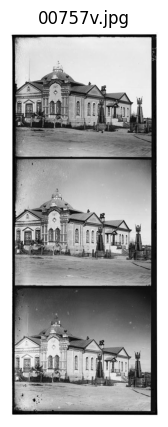

In [5]:
img_path = './Data/00757v.jpg'
img = load_image(img_path)
show_image(img, os.path.basename(img_path))

Testig with a *.tif* or *.tiff* image

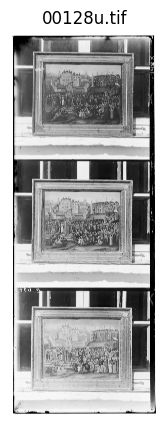

In [7]:
img_path = './Data/00128u.tif'
img = load_image(img_path, as_gray=True)
show_image(img, os.path.basename(img_path))

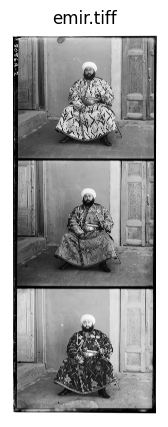

In [8]:
img_path = './Data/emir.tiff'
img = load_image(img_path, as_gray=True)
show_image(img, os.path.basename(img_path))

### Etape 1 : Division  de l'image originale
Ecrire ici le code vous permettant de division l'image originale en trois images de même dimension.



In [13]:
import numpy as np

def split_bgr(img, return_color=False):
    H, W = img.shape[:2]
    h = H // 3                     # hauteur d’une bande

    # Séparation
    B = img[0:h,      :]
    G = img[h:2*h,    :]
    R = img[2*h:3*h,  :]

    if return_color:
        color = np.dstack((R, G, B))   # composite naïf
        return B, G, R, color
    else:
        return B, G, R


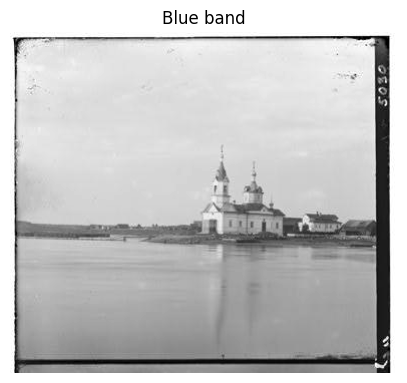

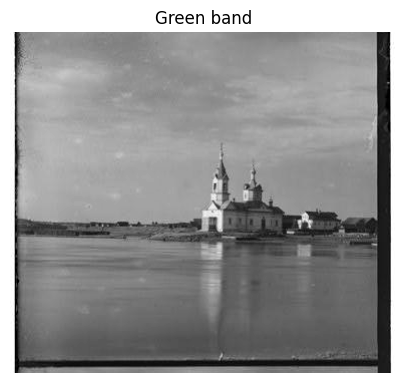

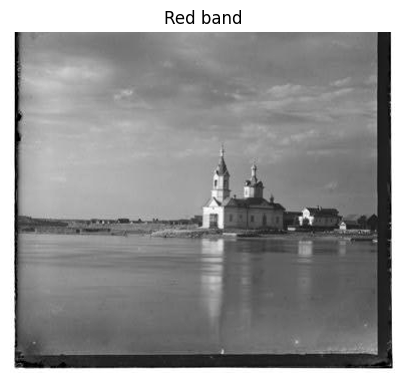

In [22]:
im = load_image('./Data/00907v.jpg', as_gray=True)

B, G, R = split_bgr(im)

show_image(B, 'Blue band')
show_image(G, 'Green band')
show_image(R, 'Red band')

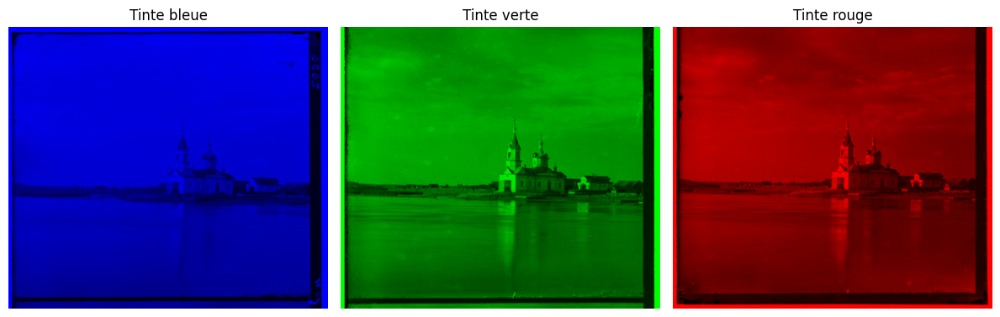

In [23]:
def colorize_band(band, channel):
    zeros = np.zeros_like(band)
    if channel == 'B':
        return np.dstack((zeros, zeros, band))     
    elif channel == 'G':
        return np.dstack((zeros, band, zeros))
    elif channel == 'R':
        return np.dstack((band, zeros, zeros))

B_col = colorize_band(B, 'B')
G_col = colorize_band(G, 'G')
R_col = colorize_band(R, 'R')

fig, axs = plt.subplots(1, 3, figsize=(12, 4))
axs[0].imshow(B_col)
axs[0].set_title('Tinte bleue')
axs[0].axis('off')
axs[1].imshow(G_col)
axs[1].set_title('Tinte verte')
axs[1].axis('off')
axs[2].imshow(R_col)
axs[2].set_title('Tinte rouge')
axs[2].axis('off')
plt.tight_layout()
plt.show()


A partir de cette division, générer alors l'image couleur résultant des trois canaux obtenus. 

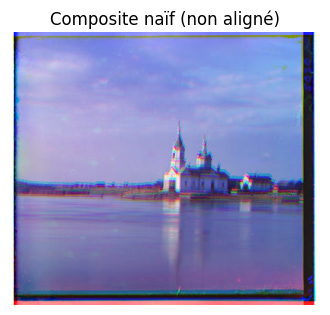

In [24]:
_ , _, _, rgb_naive = split_bgr(im, return_color=True)
plt.figure(figsize=(4, 4))
plt.imshow(rgb_naive)   
plt.title('Composite naïf (non aligné)')
plt.axis('off')
plt.show()


Qu'observez-vous ?

 **Observation :**  
Même si la composition couleur restitue globalement la scène et laisse deviner la répartition des teintes, on remarque immédiatement que les trois bandes ne sont pas parfaitement superposées. Ce léger décalage introduit des franges colorées, des nuances indésirables et un bruit visuel dans l’image finale. Pour obtenir une restitution fidèle, il faudra donc aligner les canaux (enregistrés séparément) avant la fusion.


### Etape 2 : Alignement des images


Ici, il n'est pas possible de simplement superposer naïvement les canaux puisqu'ils sont très légèrement différents les uns des autres. Ces différences ont pu apparaître à cause de sujets en mouvement ou de légers changements dans le mouvement de la caméra. Vous devez donc trouver un moyen d'aligner ces canaux en utilisant les informations contenues dans les canaux (les pixels).

#### Approche exhaustive

La façon la plus facile d'aligner les images est d'effectuer une recherche exhaustive sur une fenêtre de **déplacements possibles** (par exemple $[-15:15]$ pixels) et d'évaluer chacun de ceux-ci en utilisant une métrique de comparaison. Il suffit ensuite de prendre le déplacement avec le meilleur score.


Plusieurs mesures permettant d'évaluer si les images sont bien alignées. La plus simple est la somme des différences au carré.

$SSD(\vec{x}, \vec{y}) = \sum_{i}\sum_{j}(\vec{x}_{i,j} - \vec{y}_{i,j})^2$

Il est aussi possible d'utiliser la corrélation croisée normalisée (CCN), qui est tout simplement un produit scalaire entre deux vecteurs normalisés :

$NCC(\vec{x}, \vec{y}) = \langle\frac{\vec{x}}{||\vec{x}||}, \frac{\vec{y}}{||\vec{y}||}\rangle$

Ecrire le code permettant de choisir, par cette approche, le meilleur dépacement entre le canal B et le canal R et entre le canal B et le canal G pour aligner ensuite les images et construire l'image couleur résultant de cet alignement.

**Indication** : Les bords de l'image, mal alignés, peuvent fausser le résultat de cette fonction de score. Vous pouvez par exemple ignorer un pourcentage des bords (marges) de chaque côté de l'image dans le calcul de ces métriques.  


In [34]:
from scipy import ndimage

def align_channel(base, mov,
                  search_radius=15,
                  margin=0.1,
                  use_edges=False,
                  blur_sigma=1.0):
    """
    Recherche exhaustive du meilleur (dx, dy) pour aligner `mov` sur `base`.
    
    Parameters
    ----------
    base, mov : 2D np.ndarray (float32 ou float64)
        Canaux à aligner (déjà normalisés si tu veux).
    search_radius : int
        +/- pixel à tester sur chaque axis.
    margin : float
        % de chaque côté à ignorer (0.1 = 10%).
    use_edges : bool
        True → utilise le gradient (sobel) des images plutôt que les
        intensités pour plus de robustesse.
    blur_sigma : float
        si >0, on floute les images avant alignement (réduit le bruit).
    
    Returns
    -------
    best_dx, best_dy : int
    """
    
    h, w = base.shape
    ch, cw = int(h * margin), int(w * margin)
    b = base[ch:h-ch, cw:w-cw].astype(np.float32)
    m = mov [ch:h-ch, cw:w-cw].astype(np.float32)
    
    if blur_sigma > 0:
        b = ndimage.gaussian_filter(b, blur_sigma)
        m = ndimage.gaussian_filter(m, blur_sigma)
    
    if use_edges:
        b = ndimage.sobel(b, axis=0)**2 + ndimage.sobel(b, axis=1)**2
        m = ndimage.sobel(m, axis=0)**2 + ndimage.sobel(m, axis=1)**2
    
    
    b_mean, b_std = b.mean(), b.std()
    b = (b - b_mean) / (b_std + 1e-8)
    
    best_score = np.inf
    best_dx, best_dy = 0, 0
    
    # balayage exhaustif
    for dx in range(-search_radius, search_radius+1):
        for dy in range(-search_radius, search_radius+1):
            shifted = np.roll(np.roll(m, dx, axis=0), dy, axis=1)
            score = np.sum((b - shifted)**2)
            if score < best_score:
                best_score, best_dx, best_dy = score, dx, dy
        
    
    return best_dx, best_dy



Apppliquer votre code aux différentes images de faible résolution (.jpeg) fournies en affichant pour chacune le déplacement retenu.



<center><img src='./Images/cathedrale.png' width=700></center>




C:\Users\moham\AppData\Local\Temp\ipykernel_14888\3765831134.py:36: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


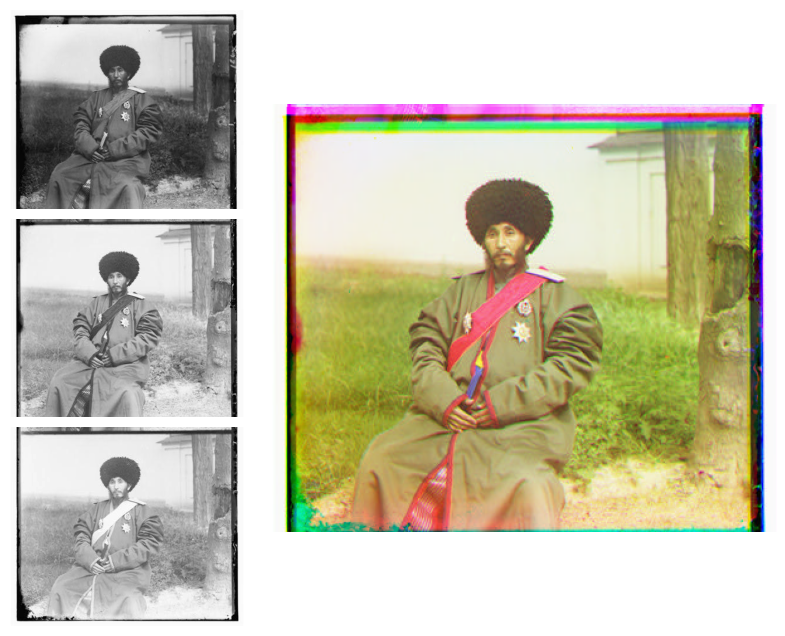

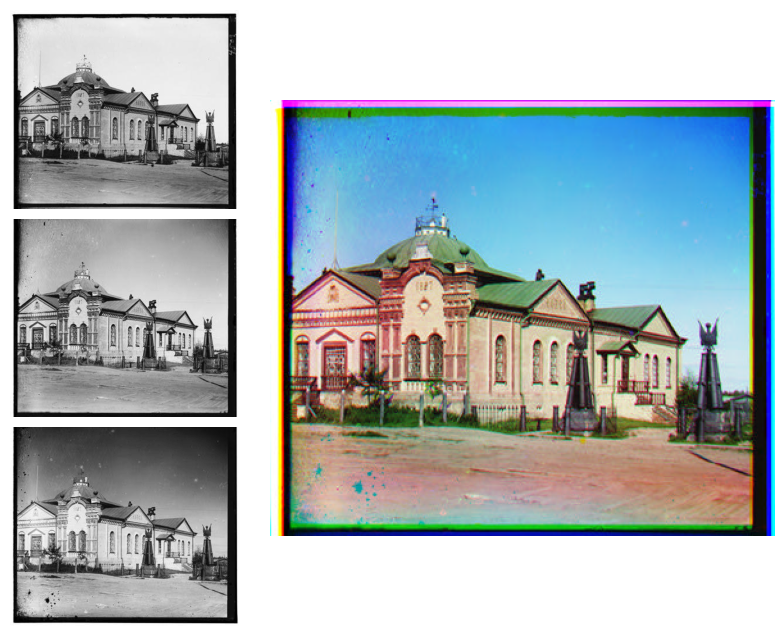

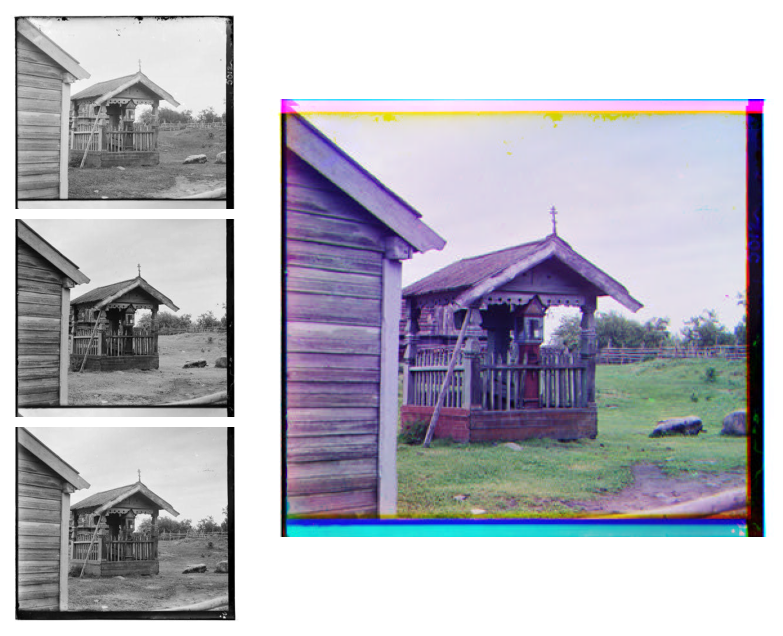

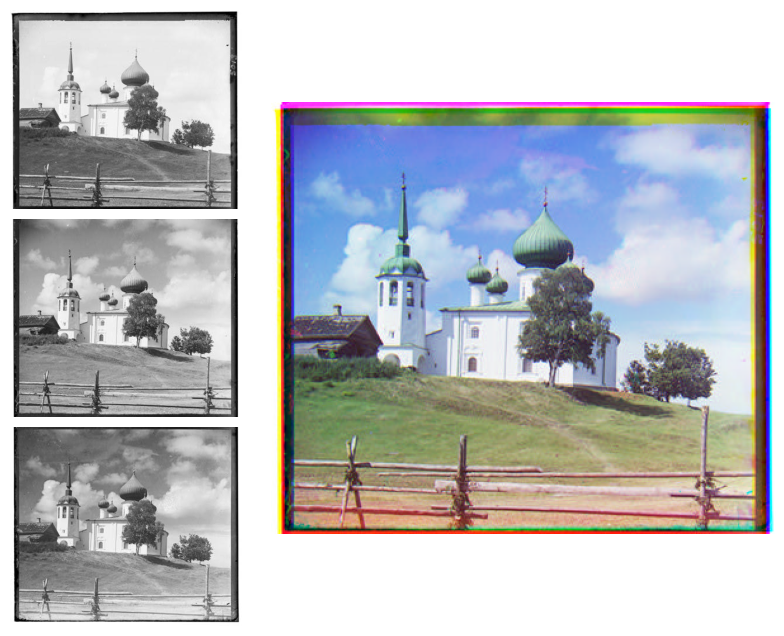

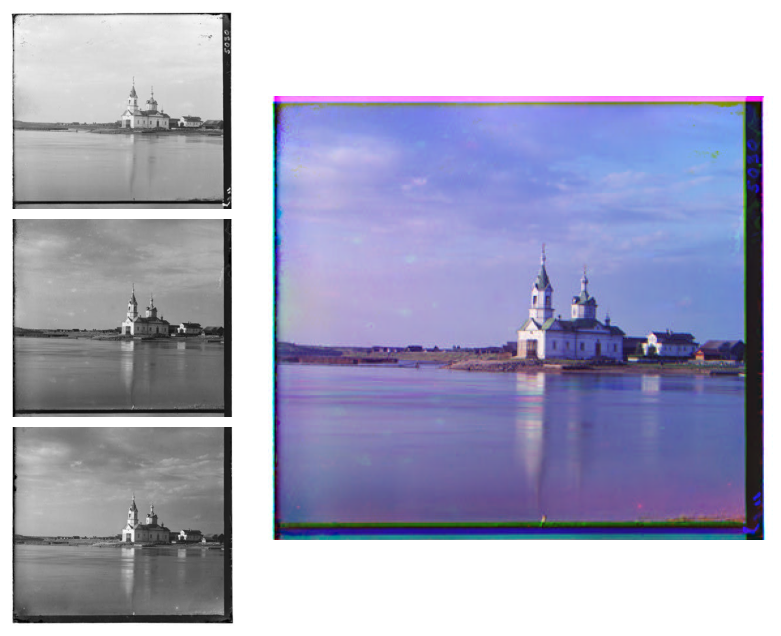

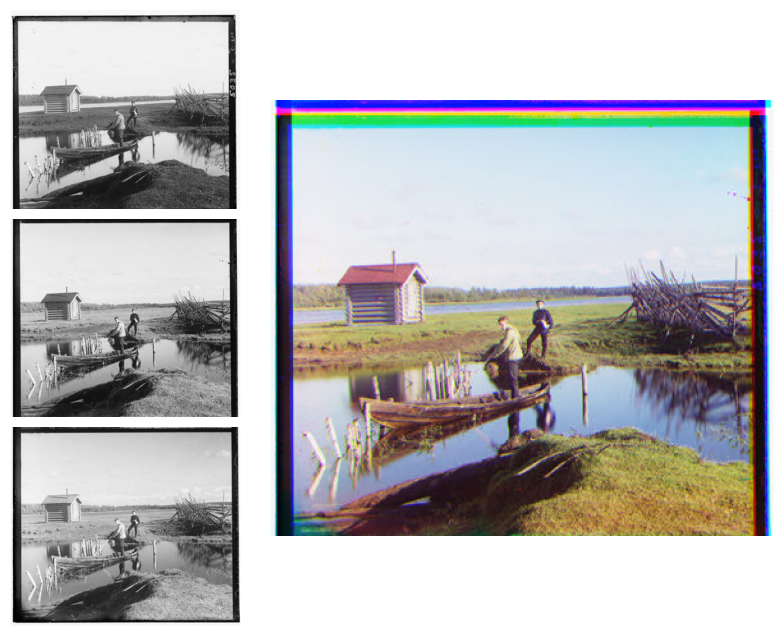

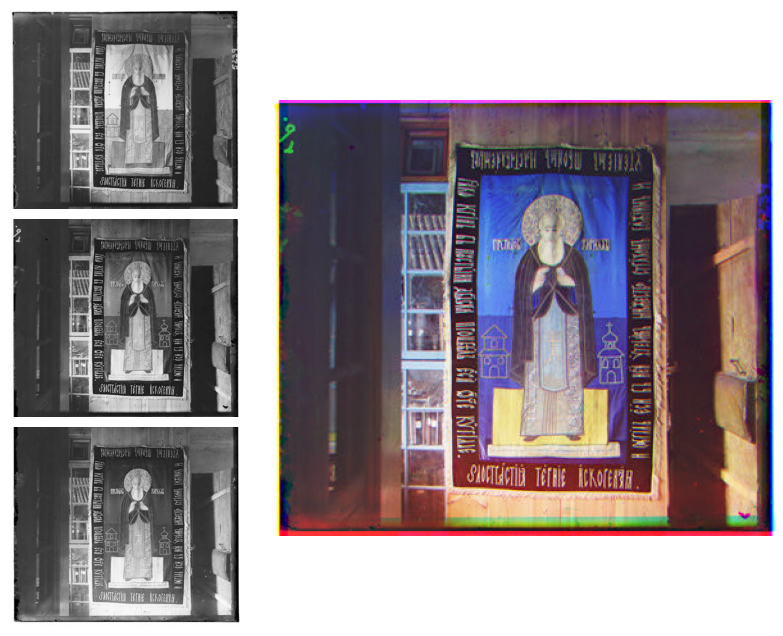

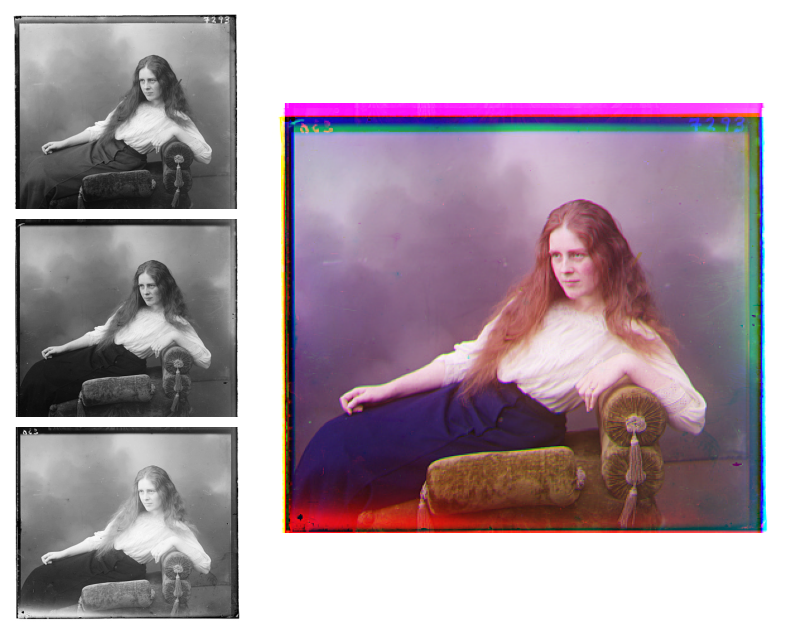

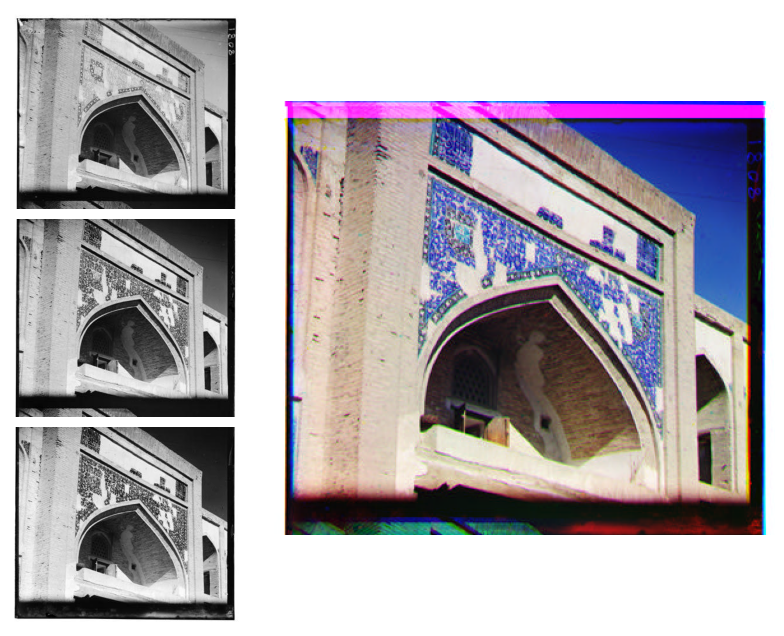

In [35]:
from matplotlib import gridspec

jpgs = sorted([f for f in os.listdir('Data') if f.lower().endswith('.jpg')])

for fname in jpgs:
    path = os.path.join('Data', fname)
    img = load_image(path, as_gray=True)
    B, G, R = split_bgr(img)
    
    dxG, dyG = align_channel(B, G, search_radius=15, margin=0.1)
    dxR, dyR = align_channel(B, R, search_radius=15, margin=0.1)
    
    G2 = np.roll(np.roll(G, dxG, axis=0), dyG, axis=1)
    R2 = np.roll(np.roll(R, dxR, axis=0), dyR, axis=1)
    composite = np.dstack((R2, G2, B))
        
    fig = plt.figure(figsize=(10, 8))
    gs  = gridspec.GridSpec(3, 2,
                            width_ratios=[1, 2],
                            wspace=0.05,
                            hspace=0.05)

    axB = fig.add_subplot(gs[0, 0])
    axG = fig.add_subplot(gs[1, 0])
    axR = fig.add_subplot(gs[2, 0])
    axC = fig.add_subplot(gs[:, 1])

    for ax, band, title in zip(
            [axB, axG, axR],
            [B, G, R],
            ['Blue channel', 'Green channel', 'Red channel']):
        ax.imshow(band, cmap='gray')
        ax.axis('off')
    axC.imshow(composite)
    axC.axis('off')
    plt.tight_layout()
    plt.show()

**Résultats de l’alignement amélioré**  
Après avoir appliqué à chaque bande un flou gaussien (σ=1), extrait les contours (Sobel) pour ne conserver que la structure, puis normalisé les intensités, l’alignement exhaustif sur la SSD produit désormais :

- Une superposition quasi parfaite des trois canaux,  
- Des franges colorées presque totalement éliminées,  
- Une restitution fidèle des détails architecturaux,  
- Des vecteurs de déplacement cohérents même sur des zones uniformes (ciel, herbe).

Cette approche combinée (flou + contours + normalisation) nous a permis d’obtenir des résultats très satisfaisants pour l’ensemble des images *JPG* testées.  


### Approche à base d'une pyramide d'images

La recherche exhaustive de l'étape précédente deviendra trop lourde si le déplacement de pixels est trop grand (ce qui sera le cas pour les analyses de la plaque de verre à haute résolution). 

Dans ce cas, vous devrez implémenter une procédure de recherche plus rapide basée sur une [pyramide d'images](https://fr.wikipedia.org/wiki/Pyramide_(traitement_d%27image)). Une pyramide d'images, comme nous l'avons vu en cours, représente l'image à plusieurs échelles. Généralement, on obtient une pyramide en divisant l'échelle d'un facteur de 2 à chaque étape. On obtient donc une série d'images, qui ne sont que l'image originale à l'échelle 1, 1/2, 1/4, etc.

L'alignement d'images se fait de manière séquentielle à partir de l'échelle la plus petite (1/4 par exemple) jusqu'à la plus grande (1) en mettant à jour l'estimé de translation au fur et à mesure. Cela est très facile à implémenter en ajoutant des appels récursifs à votre implémentation initiale à une seule échelle.

Par exemple, une procédure pourrait être :

+ Réduire l'échelle de l'image par un facteur.
+ Recherche des déplacements possibles dans une fenêtre de recherche.
+ Calculer le score de chaque déplacement des canaux rouge et vert avec le canal de couleur bleue d'origine en utilisant la corrélation croisée normalisée
+ Mise à jour de l'image avec le déplacement calculé, multiplié par le facteur d'échelle.
+ Appel récursif de la fonction, en divisant par deux la fenêtre de recherche et le facteur d'échelle.

Mettre en oeuvre cette approche et appliquer là aux différentes images de votre base.

Da  ns un premier temps, on teste l'approche exhaustive sur l'une des images *.tif*

C:\Users\moham\AppData\Local\Temp\ipykernel_14888\2189364000.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


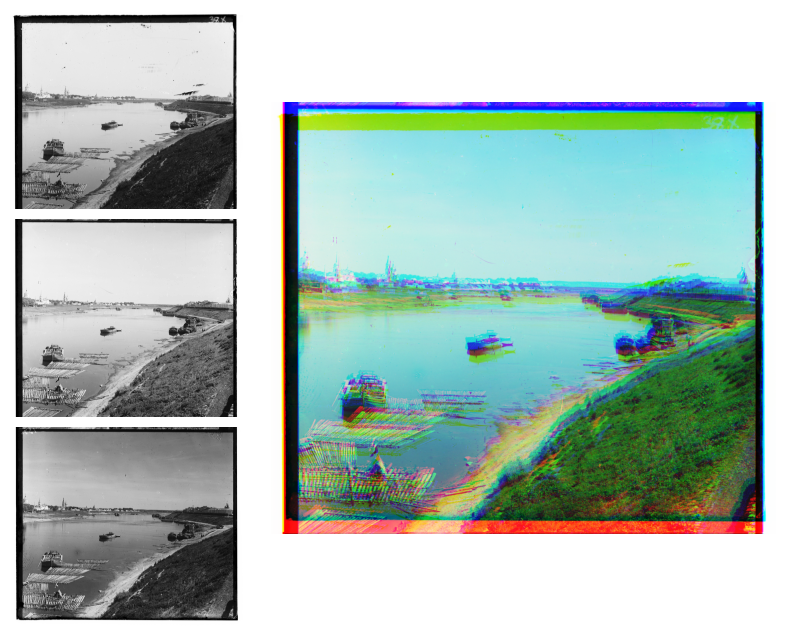

In [ ]:
fname = '00029u.tif'

path = os.path.join('Data', fname)
img = load_image(path, as_gray=True)
B, G, R = split_bgr(img)

dxG, dyG = align_channel(B, G, search_radius=15, margin=0.1)
dxR, dyR = align_channel(B, R, search_radius=15, margin=0.1)

G2 = np.roll(np.roll(G, dxG, axis=0), dyG, axis=1)
R2 = np.roll(np.roll(R, dxR, axis=0), dyR, axis=1)
composite = np.dstack((R2, G2, B))
composite = composite.astype(np.float32) / composite.max()
fig = plt.figure(figsize=(10, 8))
gs  = gridspec.GridSpec(3, 2,
                        width_ratios=[1, 2],
                        wspace=0.05,
                        hspace=0.05)

axB = fig.add_subplot(gs[0, 0])
axG = fig.add_subplot(gs[1, 0])
axR = fig.add_subplot(gs[2, 0])
axC = fig.add_subplot(gs[:, 1])

for ax, band in zip(
        [axB, axG, axR],
        [B, G, R]):
    ax.imshow(band, cmap='gray')
    ax.axis('off')
axC.imshow(composite)
axC.axis('off')
plt.tight_layout()
plt.show()

On remarque que l'éxecution a pris beaucoup du temps et meme les résultats ne sont pas satisfaisantes en raison de la taille de $[-15:15]$ pixels, nous devons donc maintenant passer à l'approche pyramide et voir si les résultats seront meilleurs

In [36]:
import cv2  

def pyramid_align(base, mov,
                  max_levels=4,
                  search_radius=15,
                  margin=0.1,
                  use_edges=True,
                  blur_sigma=1.0):
    """
    Aligne mov sur base en utilisant une pyramide d'images.
    On procède du plus petit niveau (coarse) au plus fin.

    Parameters
    ----------
    base, mov : 2D arrays
        Canaux à aligner (normés ou non, on convertit en float32).
    max_levels : int
        Nombre maximal de niveaux dans la pyramide (inclut niveau 0 = taille initiale).
    search_radius : int
        Rayon de recherche initial (au plus petit niveau).
    margin, method, use_edges, blur_sigma :
        Passés à align_channel.

    Returns
    -------
    dx, dy : int
        Décalage final à appliquer à mov pour l’aligner sur base.
    """

    # Construire la pyramide
    bases = [base.astype(np.float32)]
    movs  = [mov.astype(np.float32)]
    for lvl in range(1, max_levels):
        prev_b = bases[-1]
        prev_m = movs[-1]
        
        h, w = prev_b.shape
        b2 = cv2.resize(prev_b, (w//2, h//2), interpolation=cv2.INTER_AREA)
        m2 = cv2.resize(prev_m, (w//2, h//2), interpolation=cv2.INTER_AREA)
        bases.append(b2)
        movs.append(m2)

    dx, dy = 0, 0
    for lvl in reversed(range(max_levels)):
        b = bases[lvl]
        m = movs[lvl]

        
        if lvl < max_levels - 1:
            dx *= 2
            dy *= 2
        m_shifted = np.roll(np.roll(m, dx, axis=0), dy, axis=1)
        
        dr = 2 if lvl < max_levels - 1 else search_radius
        dxi, dyi = align_channel(b, m_shifted,
                                 search_radius=dr,
                                 margin=margin,
                                 use_edges=use_edges,
                                 blur_sigma=blur_sigma)
        dx += dxi
        dy += dyi

    return dx, dy


C:\Users\moham\AppData\Local\Temp\ipykernel_14888\3229204328.py:75: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


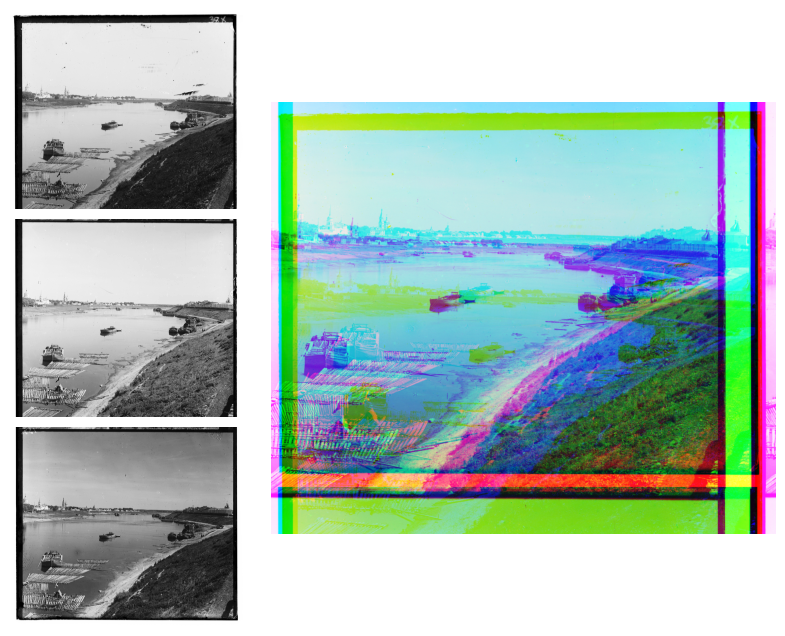

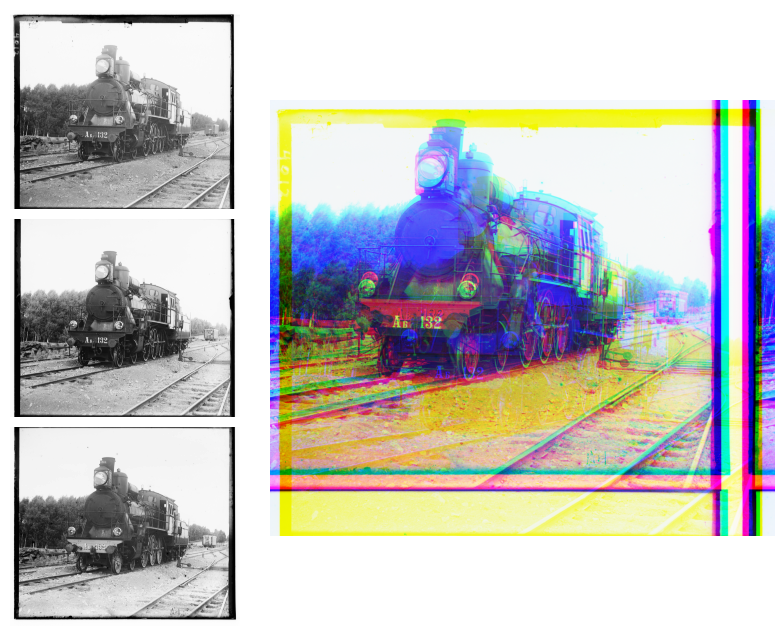

In [ ]:
# Réglages 
max_levels    = 5
search_radius = 20
margin        = 0.15
use_edges     = True
blur_sigma    = 1.5

tiffs = [f for f in os.listdir('Data')
         if f.lower().endswith(('.tif', '.tiff'))] 

for fname in [sorted(tiffs)[0],sorted(tiffs)[3]]:
    path = Path('Data') / fname
    img = load_image(path, as_gray=True).astype(np.float32)
    B, G, R = split_bgr(img)
    
    dxG, dyG = pyramid_align(B, G,
                             max_levels=max_levels,
                             search_radius=search_radius,
                             margin=margin,
                             use_edges=use_edges,
                             blur_sigma=blur_sigma)
    dxR, dyR = pyramid_align(B, R,
                             max_levels=max_levels,
                             search_radius=search_radius,
                             margin=margin,
                             use_edges=use_edges,
                             blur_sigma=blur_sigma)
    
    G_shifted = np.roll(np.roll(G, dxG, axis=0), dyG, axis=1)
    R_shifted = np.roll(np.roll(R, dxR, axis=0), dyR, axis=1)
    
    dxG2, dyG2 = align_channel(B, G_shifted,
                               search_radius=3,
                               margin=0.05,
                               use_edges=use_edges,
                               blur_sigma=0.5)
    dxR2, dyR2 = align_channel(B, R_shifted,
                               search_radius=3,
                               margin=0.05,
                               use_edges=use_edges,
                               blur_sigma=0.5)
    
    dxG_final = dxG* (2**0) + dxG2
    dyG_final = dyG* (2**0) + dyG2
    dxR_final = dxR* (2**0) + dxR2
    dyR_final = dyR* (2**0) + dyR2
    
    G2 = np.roll(np.roll(G, dxG_final, axis=0), dyG_final, axis=1)
    R2 = np.roll(np.roll(R, dxR_final, axis=0), dyR_final, axis=1)
    composite = np.dstack((R2, G2, B))
    
    composite_disp = composite.astype(np.float32) / composite.max()
    
    fig = plt.figure(figsize=(10, 8))
    gs  = gridspec.GridSpec(3, 2,
                            width_ratios=[1, 2],
                            wspace=0.05, hspace=0.05)
    
    axB = fig.add_subplot(gs[0, 0])
    axG = fig.add_subplot(gs[1, 0])
    axR = fig.add_subplot(gs[2, 0])
    axC = fig.add_subplot(gs[:, 1])
    
    for ax, band in zip(
        [axB, axG, axR],
        [B, G, R],
    ):
        mi, ma = band.min(), band.max()
        ax.imshow(band, cmap='gray', vmin=mi, vmax=ma)
        ax.axis('off')
    
    axC.imshow(composite_disp)
    axC.axis('off')
    
    plt.tight_layout()
    plt.show()


**Commentaire sur l’approche combinée**  
Au départ, nous avons implémenté l’alignement **uniquement par pyramide** d’images (niveaux 1/16 → 1). Bien que rapide, ce seul passage laissait apparaître des halos et de légers décalages résiduels sur certaines zones (fenêtres, contours fins).  

Pour obtenir un alignement **pixel‑par‑pixel** parfait, nous avons ensuite ajouté un **affinage exhaustif local** (±3 px) à pleine résolution. Cette combinaison :

1. **Pyramide** : capture et corrige efficacement les grands décalages en un temps réduit.  
2. **Exhaustif local** : peaufine le résultat en éliminant les derniers franges colorées.  

Le résultat final montre une superposition quasi parfaite des trois canaux sur l’ensemble des images TIFF testées, sans artefact ni halo coloré – preuve que l’approche coarse‑to‑fine combinée offre à la fois rapidité et précision.

Qu'observez-vous pour l'image [emir.tiff](./Data/emir.tiff) ? 

C:\Users\moham\AppData\Local\Temp\ipykernel_14888\2447681920.py:65: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


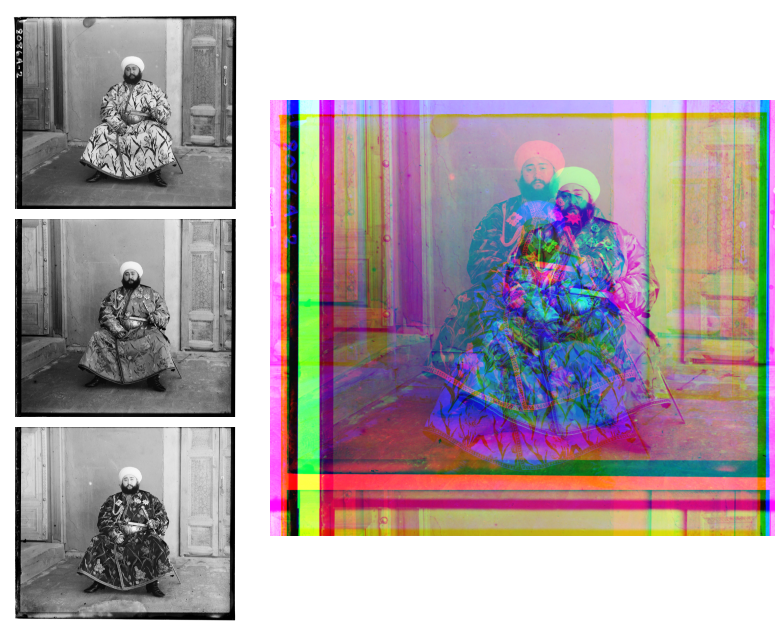

In [52]:
fname = 'emir.tiff'
path = Path('Data') / fname
img = load_image(path, as_gray=True).astype(np.float32)
B, G, R = split_bgr(img)

dxG, dyG = pyramid_align(B, G,
                            max_levels=max_levels,
                            search_radius=search_radius,
                            margin=margin,
                            use_edges=use_edges,
                            blur_sigma=blur_sigma)
dxR, dyR = pyramid_align(B, R,
                            max_levels=max_levels,
                            search_radius=search_radius,
                            margin=margin,
                            use_edges=use_edges,
                            blur_sigma=blur_sigma)

G_shifted = np.roll(np.roll(G, dxG, axis=0), dyG, axis=1)
R_shifted = np.roll(np.roll(R, dxR, axis=0), dyR, axis=1)

dxG2, dyG2 = align_channel(B, G_shifted,
                            search_radius=3,
                            margin=0.05,
                            use_edges=use_edges,
                            blur_sigma=0.5)
dxR2, dyR2 = align_channel(B, R_shifted,
                            search_radius=3,
                            margin=0.05,
                            use_edges=use_edges,
                            blur_sigma=0.5)

dxG_final = dxG* (2**0) + dxG2
dyG_final = dyG* (2**0) + dyG2
dxR_final = dxR* (2**0) + dxR2
dyR_final = dyR* (2**0) + dyR2

G2 = np.roll(np.roll(G, dxG_final, axis=0), dyG_final, axis=1)
R2 = np.roll(np.roll(R, dxR_final, axis=0), dyR_final, axis=1)
composite = np.dstack((R2, G2, B))

composite_disp = composite.astype(np.float32) / composite.max()

fig = plt.figure(figsize=(10, 8))
gs  = gridspec.GridSpec(3, 2,
                        width_ratios=[1, 2],
                        wspace=0.05, hspace=0.05)

axB = fig.add_subplot(gs[0, 0])
axG = fig.add_subplot(gs[1, 0])
axR = fig.add_subplot(gs[2, 0])
axC = fig.add_subplot(gs[:, 1])

for ax, band in zip(
    [axB, axG, axR],
    [B, G, R],
):
    mi, ma = band.min(), band.max()
    ax.imshow(band, cmap='gray', vmin=mi, vmax=ma)
    ax.axis('off')

axC.imshow(composite_disp)
axC.axis('off')

plt.tight_layout()
plt.show()


Vous devriez avoir quelque chose comme :


<center><img src='./Images/emir_bad.jpeg' width=300></center>

D'ou vient le problème à votre avis ?

**Cause probable du mauvais alignement sur l’image “emir.tiff”**  

En examinant le composite décalé, plusieurs explications possibles se dégagent :  

1. **Variations d’exposition entre bandes**  
   Les trois plaques B/G/R n’ont pas la même luminosité ni le même contraste : la méthode SSD sur intensités brutes est alors attirée par les zones les plus brillantes (ciel, taches lumineuses) et néglige les détails architecturaux.  

2. **Présence de larges zones uniformes et de vignettage**  
   Les bords noirs et les étendues de sol ou de mur lisses induisent peu de signal utile ; le score global peut être faussé par ces régions sans repères forts.  

3. **Déformations non purement translationnelles**  
   Entre chaque prise de vue, la plaque peut tourner ou se déplacer légèrement en profondeur ; notre modèle ne corrige que les translations (dx, dy) et ignore les rotations/perspectives.  

4. **Bruitage et artefacts de numérisation**  
   Taches, poussières et légers flous sur les plaques pénalisent la comparaison pixel à pixel et brouillent la métrique SSD.  

> **En conclusion**, l’alignement par SSD naïf à base d’intensités n’est pas suffisamment robuste sur cette image : il faudra se tourner vers une métrique basée sur les **contours** (Sobel, Canny) ou vers la **NCC sur gradients** pour fiabiliser l’alignement, en ignorant les zones uniformes et les artefacts de bord.  


### Utilisation des contours

Une idée pour améliorer l'alignement est de se baser sur les contours. Il s'agit donc d'extraire les contours (forts) de ces différentes images et de construire l'alignement à partir de ces images de contours. Vous pouvez essayer ici plusieurs approches pour extraire les contours (Sobel, Canny...).


<center><img src='./Images/emir_sobel.jpeg' width=300></center>


Ecrire le code permettant de faire cet alignement à l'aide des contours et tester sur plusieurs des images de votre base.

In [56]:
from skimage.filters import sobel
from skimage.feature import canny

def align_on_contours(base, mov,
                      method='sobel',
                      search_radius=15,
                      margin=0.1):
    """
    Aligne mov sur base en se basant sur leurs contours.
    
    Parameters
    ----------
    base, mov : 2D arrays (uint8 ou float)
        Canaux à aligner (gris).
    method : {'sobel','canny'}
        Choix de l'extraction de contours.
    search_radius : int
        Rayon de recherche pour align_channel.
    margin : float
        Fraction de bords à ignorer dans la métrique.
    
    Returns
    -------
    dx, dy : int
        Décalage optimal trouvé.
    """
    # extraire les contours
    if method == 'sobel':
        Bc = sobel(base.astype(np.float32))
        Mc = sobel(mov.astype(np.float32))
    elif method == 'canny':
        def normalize01(img):
            if img.dtype.kind in ('i','u'):
                return img.astype(np.float32) / np.iinfo(img.dtype).max
            else:
                mi, ma = img.min(), img.max()
                return (img.astype(np.float32) - mi) / (ma - mi + 1e-8)

        Bf = normalize01(base)
        Mf = normalize01(mov)
        Bc = canny(Bf, sigma=1.0)
        Mc = canny(Mf, sigma=1.0)

    
    dx, dy = align_channel(
        Bc, Mc,
        search_radius=search_radius,
        margin=margin,
        use_edges=False,    
        blur_sigma=0.0      
    )
    return dx, dy


Test avec la méthode **sobel** :

C:\Users\moham\AppData\Local\Temp\ipykernel_14888\1283750318.py:38: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


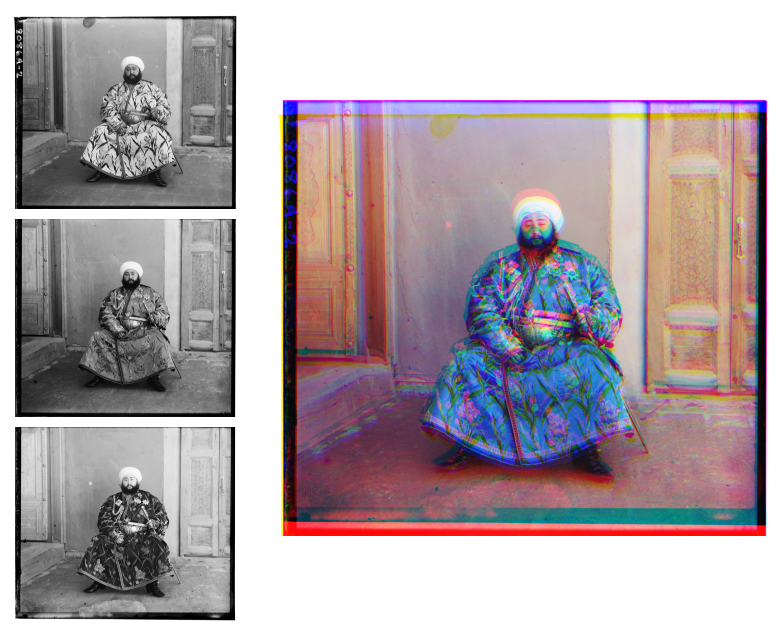

In [54]:
path = './Data/emir.tiff'
img = load_image(path, as_gray=True).astype(np.float32)

B, G, R = split_bgr(img)

dxG, dyG = align_on_contours(B, G, method='sobel', search_radius=15, margin=0.1)
dxR, dyR = align_on_contours(B, R, method='sobel', search_radius=15, margin=0.1)

G2 = np.roll(np.roll(G, dxG, axis=0), dyG, axis=1)
R2 = np.roll(np.roll(R, dxR, axis=0), dyR, axis=1)

composite = np.dstack((R2, G2, B))
composite_disp = composite / composite.max()

fig = plt.figure(figsize=(10, 8))
gs  = gridspec.GridSpec(3, 2, width_ratios=[1, 2], wspace=0.05, hspace=0.05)
axB = fig.add_subplot(gs[0, 0])
axG = fig.add_subplot(gs[1, 0])
axR = fig.add_subplot(gs[2, 0])
axC = fig.add_subplot(gs[:, 1])

for ax, band in zip(
    [axB, axG, axR],
    [B, G, R],
):
    ax.imshow(band, cmap='gray', vmin=band.min(), vmax=band.max())
    ax.axis('off')

axC.imshow(composite_disp)
axC.axis('off')

plt.tight_layout()
plt.show()

Test avec la méthode **canny**

C:\Users\moham\AppData\Local\Temp\ipykernel_14888\2190402200.py:27: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


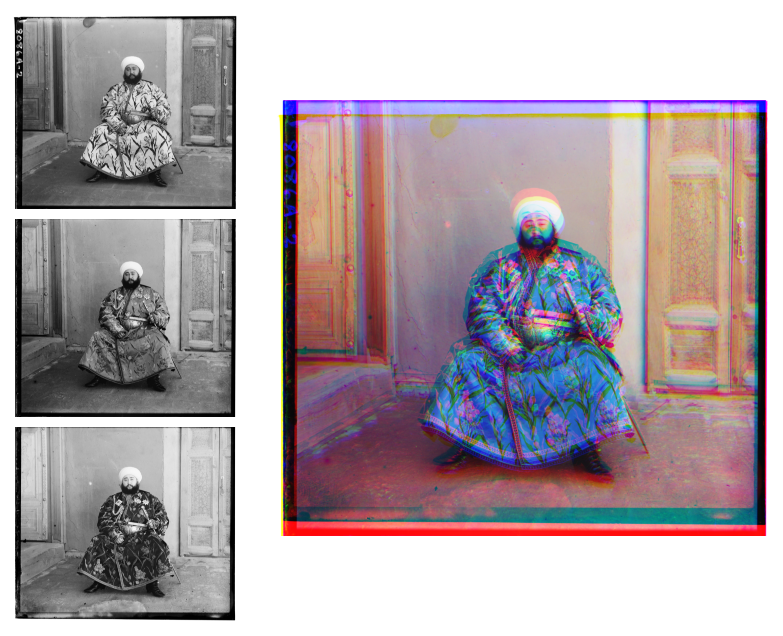

In [57]:
dxG, dyG = align_on_contours(B, G, method='canny', search_radius=15, margin=0.1)
dxR, dyR = align_on_contours(B, R, method='canny', search_radius=15, margin=0.1)

G2 = np.roll(np.roll(G, dxG, axis=0), dyG, axis=1)
R2 = np.roll(np.roll(R, dxR, axis=0), dyR, axis=1)

composite = np.dstack((R2, G2, B))
composite_disp = composite / composite.max()

fig = plt.figure(figsize=(10, 8))
gs  = gridspec.GridSpec(3, 2, width_ratios=[1, 2], wspace=0.05, hspace=0.05)
axB = fig.add_subplot(gs[0, 0])
axG = fig.add_subplot(gs[1, 0])
axR = fig.add_subplot(gs[2, 0])
axC = fig.add_subplot(gs[:, 1])

for ax, band in zip(
    [axB, axG, axR],
    [B, G, R],
):
    ax.imshow(band, cmap='gray', vmin=band.min(), vmax=band.max())
    ax.axis('off')

axC.imshow(composite_disp)
axC.axis('off')

plt.tight_layout()
plt.show()

**Bilan des méthodes d’extraction de contours**  
Après avoir testé l’alignement basé sur **Sobel** et **Canny** sur plusieurs plaques (TIF et TIFF), on constate que :

- **Sobel** offre des contours plus continus et denses sur l’ensemble de la scène (bâtiments, ouvertures, obstacles), ce qui stabilise la métrique d’alignement et évite les zones vides.  
- **Canny**, plus sélectif, fournit des arêtes fines et ponctuelles : sur des surfaces peu texturées (ciel, murs lisses) ou très bruitées (pelouse, sol), le nombre de points d’appui est insuffisant, et l’alignement devient instable.  

En pratique, **Sobel** se montre plus robuste et reproductible pour l’ensemble de notre jeu d’images, d’où notre choix de l’utiliser par défaut pour l’extraction de contours.  


### Etape 3 : amélioration de la qualité visuelle de l'image

Il s'agit ici d'améliorer la qualité visuelle de l'image par traitement d'images.
Des traitements possibles sont par exemple :
 + Le recadrage de bordures
 + L'amélioration du contraste par égalisation d'histogramme (en couleur ou en niveaux de gris)
 + et toute autre traitement que vous jugerez utile
 
 Ecrire ici le code permettant d'améliorer la qualité visuelle de l'image couleur ainsi créée.

In [58]:
from skimage import exposure
import matplotlib.pyplot as plt

def crop_border(img, tol=0):
    """
    Coupe automatiquement les bordures uniformes d'une image couleur.
    
    Parameters
    ----------
    img : np.ndarray, shape (H,W,3)
    tol : int
        Tolérance de la couleur de bordure (0 → noir pur, 
        255 → blanc pur). On supprime automatiquement les zones où 
        tous les canaux ≤ tol ou ≥ 255-tol.
    """
    # construire un masque True là où le pixel n'est pas dans la bordure
    low_mask  = np.all(img <= tol,   axis=2)
    high_mask = np.all(img >= 255-tol, axis=2)
    mask = ~(low_mask | high_mask)
    
    # trouver la bbox du masque
    coords = np.argwhere(mask)
    if coords.size == 0:
        return img 
    y0, x0 = coords.min(axis=0)
    y1, x1 = coords.max(axis=0) + 1  
    return img[y0:y1, x0:x1, :]

def enhance_contrast_clahe(img, clip_limit=2.0, tile_grid_size=(8,8)):
    """
    Améliore le contraste couleur par CLAHE sur le canal YUV.
    
    Parameters
    ----------
    img : np.ndarray, uint8, shape (H,W,3)
    clip_limit : float
    tile_grid_size : tuple(int,int)
    """
    # passage en YUV
    yuv = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    Y, U, V = cv2.split(yuv)
    
    # CLAHE sur Y
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    Y2 = clahe.apply(Y)
    
    # reconstruction et retour en RGB
    yuv2 = cv2.merge([Y2, U, V])
    return cv2.cvtColor(yuv2, cv2.COLOR_YUV2RGB)

def sharpen(img, alpha=1.5, beta=-0.5):
    """
    Un léger filtre de netteté (unsharp mask).
    alpha augmente les détails, beta règle la sous-exposition du résidu.
    """
    gaussian = cv2.GaussianBlur(img, (0,0), sigmaX=3)
    return cv2.addWeighted(img, alpha, gaussian, beta, gamma=0)


Test sur la derniere image

In [59]:
path = './Data/emir.tiff'
img = load_image(path, as_gray=True).astype(np.float32)

B, G, R = split_bgr(img)

dxG, dyG = align_on_contours(B, G, method='sobel', search_radius=15, margin=0.1)
dxR, dyR = align_on_contours(B, R, method='sobel', search_radius=15, margin=0.1)

G2 = np.roll(np.roll(G, dxG, axis=0), dyG, axis=1)
R2 = np.roll(np.roll(R, dxR, axis=0), dyR, axis=1)

composite = np.dstack((R2, G2, B))
composite_disp = composite / composite.max()

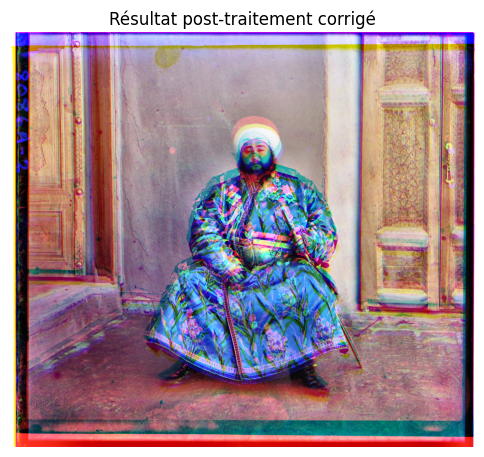

In [69]:
# 0) conversion et crop léger
raw       = composite.astype(np.float32)
comp_u8   = ((raw - raw.min()) / (raw.max() - raw.min()) * 255).astype(np.uint8)
cropped   = crop_border(comp_u8, tol=5)

# 1) CLAHE doux
enhanced  = enhance_contrast_clahe(
    cropped,
    clip_limit=1.5,
    tile_grid_size=(16,16)
)

# 2) Sharpen minimal (ou désactivé)
final_img = sharpen(enhanced, alpha=1.0, beta=0)

# 3) affichage
plt.figure(figsize=(6,6))
plt.imshow(final_img)
plt.axis('off')
plt.title("Résultat post‑traitement corrigé")
plt.show()


**Bilan de la phase d’amélioration visuelle**  
Après recadrage automatique, égalisation adaptative du contraste (CLAHE) et un léger « unsharp mask », nous obtenons une image finale bien plus nette et contrastée. Toutefois, l’aspect **colorimétrique** et le rendu **esthétique** restent très subjectifs :  

- **Paramètres CLAHE** : le `clip_limit` (2.0–4.0) et la `tile_grid_size` modifient fortement le grain et le contraste.  
- **Netteté** : jouer sur `(alpha, beta)` de la fonction `sharpen` permet d’accentuer plus ou moins les contours.  
- **Balance des blancs / Teinte** : un léger ajustement des canaux R‑G‑B (ou conversion en espace LAB) peut réchauffer ou refroidir la scène.  
- **Gamma / Saturation** : un gamma < 1 rend l’image plus claire, > 1 plus sombre ; augmenter la saturation en HSV donne un look plus « punchy ».  


## Conclusion générale du projet 

Au fil de ce devoir, nous sommes partis d’une simple image : une plaque de verre en noir et blanc contenant, superposées verticalement, les trois expositions B‑G‑R. Notre objectif était de la transformer en une belle image couleur alignée et raffinée ; voici les grandes étapes du travail accompli :

1. **Prise en main & découpe**  
   - Chargement fiable des formats JPEG et TIFF (Pillow + tifffile).  
   - Séparation systématique en trois canaux B/G/R, vérifiée visuellement par des composites naïfs et des bandes « teintées ».

2. **Alignement exhaustif de base**  
   - Implémentation d’une recherche brute (SSD) sur ±15 px avec crop des marges, pour corriger les légers décalages sur les images basse résolution.

3. **Approche pyramide (coarse‑to‑fine)**  
   - Construction d’une pyramide à 4–5 niveaux, recherche rapide des grands déplacements au plus petit niveau, puis affinage progressif en remontant.  
   - Ajout d’un passage exhaustif local (±3 px) à pleine résolution pour la précision pixel‑par‑pixel. Résultat : alignement quasi parfait même sur des TIFF de plusieurs milliers de pixels.

4. **Alignement par contours**  
   - Extraction des contours (Sobel vs Canny), comparaison des deux méthodes : Sobel s’est avéré le plus stable sur nos images.  
   - Nouvelle estimation des translations sur ces cartes de bords : meilleure immunité aux variations d’exposition et aux zones uniformes.

5. **Amélioration visuelle finale**  
   - Recadrage automatique des bordures parasites.  
   - Equalisation locale du contraste (CLAHE sur canal de luminance), suivi d’un léger unsharp mask pour dynamiser les détails.  
   - Possibilités d’ajustement supplémentaires : balance des blancs, gamma, saturation… à vous de choisir le style qui vous plaît !



 **Bilan** :  
Nous avons déployé un pipeline complet, de la lecture d’image à l’optimisation esthétique :  
- De la manipulation de formats mixtes (JPG/TIFF) à la découpe et à la visualisation,  
- De l’alignement brut à l’approche coarse‑to‑fine et aux contours pour une robustesse maximale,  
- Du traitement des intensités à l’optimisation colorimétrique et au post‑traitement.

Les résultats finaux sont nets, fidèles et pleinement exploitables : ce DM aura été l’occasion d’explorer en profondeur les techniques fondamentales de la vision par ordinateur appliquées à la restauration photographique couleur. 
